In [2]:
import numpy as np
import random
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.transforms.functional import InterpolationMode as IMode

from PIL import Image

from ds import *
from losses import *
from networks_SRGAN import *
from utils import *

## Loading the pre-trained (frozen) SRGAN base model and instantiating BayesCap

In [3]:
NetG = Generator()
NetG.load_state_dict(torch.load('../ckpt/srgan-ImageNet-bc347d67.pth', map_location='cuda:0'))

model_parameters = filter(lambda p: True, NetG.parameters())
params = sum([np.prod(p.size()) for p in model_parameters])
print("Number of Parameters:",params)


NetC = BayesCap(in_channels=3, out_channels=3)

Number of Parameters: 1547350


## Load the datasets

In [5]:
# train_dset = ImgDset(dataroot='<path to training images>', image_size=(96,96), upscale_factor=4, mode='tr')
val_dset = ImgDset(dataroot='../../../BayesCap/data/SR/val/Set5/original/', image_size=(256,256), upscale_factor=4, mode='tr')
test_dset = ImgDset(dataroot='../../../BayesCap/data/SR/val/Set5/original/', image_size=(256,256), upscale_factor=4, mode='tr')

# train_loader = DataLoader(train_dset, batch_size=4, pin_memory=True, shuffle=True)
val_loader = DataLoader(val_dset, batch_size=1, pin_memory=True, shuffle=False)
test_loader = DataLoader(test_dset, batch_size=1, pin_memory=True, shuffle=False)

## Training loop

In [ ]:
train_BayesCap(
	NetC,
	NetG,
	train_loader,
	test_loader,
	Cri = TempCombLoss(alpha_eps=1e-5, beta_eps=1e-2),
	device='cuda',
	dtype=torch.cuda.FloatTensor,
	init_lr=1e-4,
	num_epochs=20,
	eval_every=2,
	ckpt_path='../ckpt/BayesCap_SRGAN',
)

## Evaluating BayesCap

In [6]:
NetG = Generator()
NetG.load_state_dict(torch.load('../ckpt/srgan-ImageNet-bc347d67.pth', map_location='cuda:0'))
NetG.to('cuda')
NetG.eval()

NetC = BayesCap(in_channels=3, out_channels=3)
NetC.load_state_dict(torch.load('../ckpt/BayesCap_SRGAN_best.pth', map_location='cuda:0'))
NetC.to('cuda')
NetC.eval()

BayesCap(
  (conv_block1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
    (1): PReLU(num_parameters=1)
  )
  (trunk): Sequential(
    (0): ResidualConvBlock(
      (rcb): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): PReLU(num_parameters=1)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (1): ResidualConvBlock(
      (rcb): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): PReLU(num_parameters=1)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bi

## Displaying output

Image 0 ...


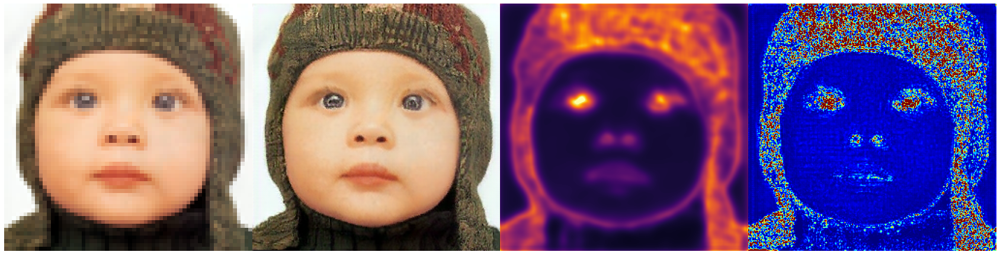

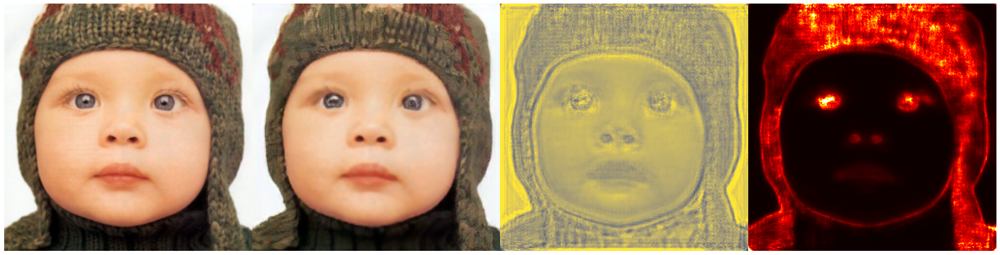

Image 1 ...


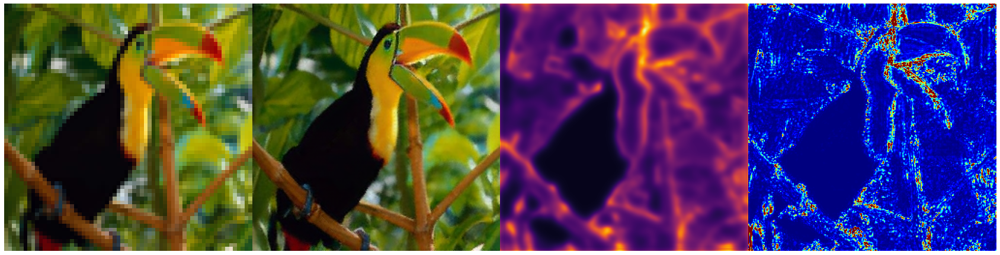

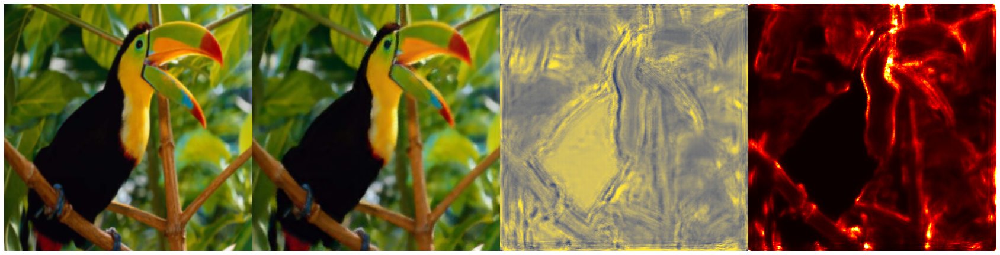

Image 2 ...


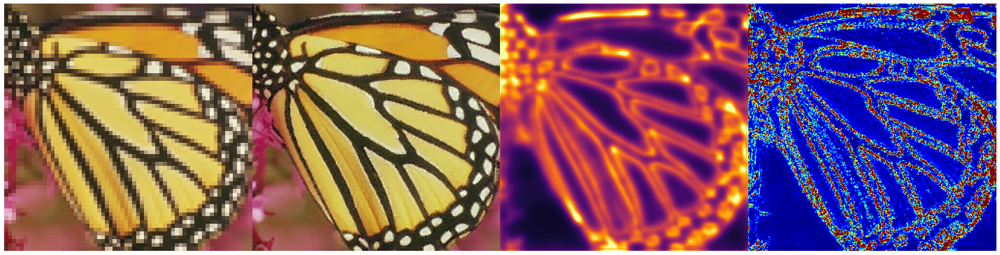

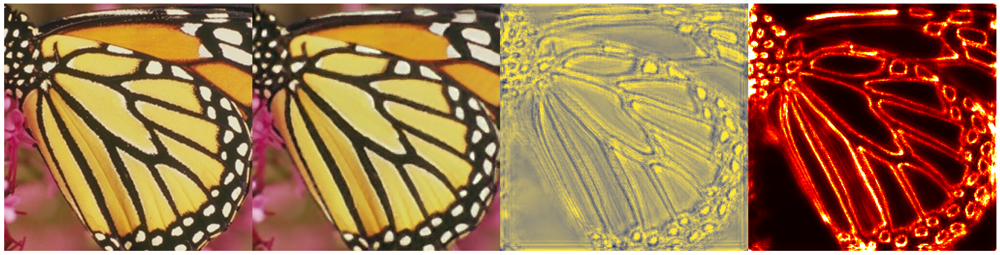

Image 3 ...


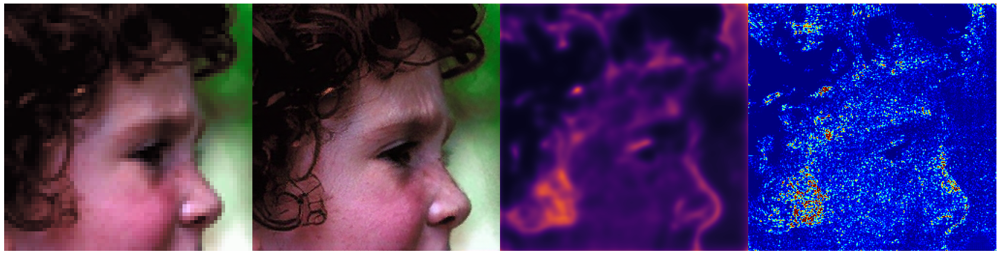

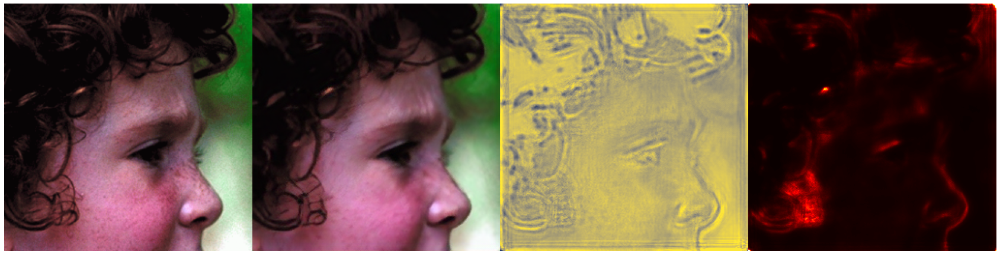

Image 4 ...


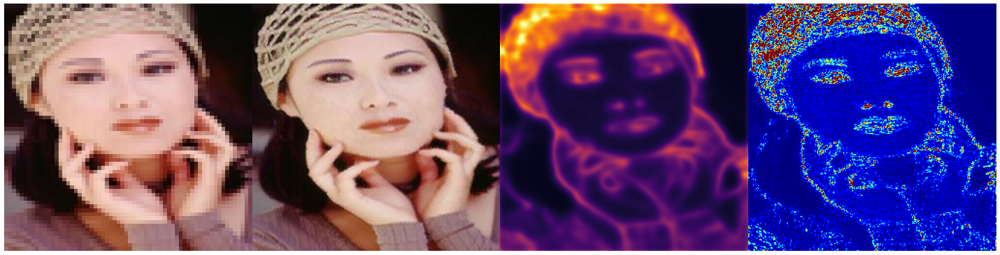

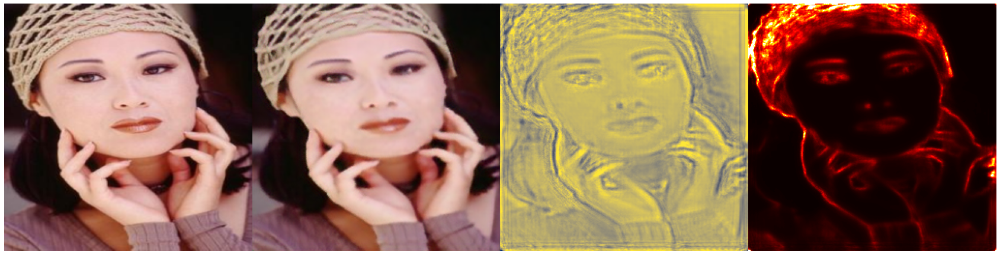

In [9]:
device = 'cuda'
dtype=torch.cuda.FloatTensor
num_imgs = 0
mean_ssim = 0
for (idx, batch) in enumerate(val_loader):
    print('Image {} ...'.format(idx))
    xLR, xHR = batch[0].to(device), batch[1].to(device)
    xLR, xHR = xLR.type(dtype), xHR.type(dtype)
    # pass them through the network
    with torch.no_grad():
        xSR = NetG(xLR)
        xSRC_mu, xSRC_alpha, xSRC_beta = NetC(xSR)
    n_batch = xSRC_mu.shape[0]
    for j in range(n_batch):
        num_imgs += 1
        mean_ssim += img_ssim(xSRC_mu[j], xHR[j])
        
    plt.figure(figsize=(30,10))
    plt.subplot(1,4,1)
    plt.imshow(xLR[0].to('cpu').data.clip(0,1).transpose(0,2).transpose(0,1))
    plt.axis('off')
    
    plt.subplot(1,4,2)
    plt.imshow(xSR[0].to('cpu').data.clip(0,1).transpose(0,2).transpose(0,1))
    plt.axis('off')
    
    plt.subplot(1,4,3)
    a_map = (1/(xSRC_alpha[0] + 1e-5)).to('cpu').data
    plt.imshow(a_map.transpose(0,2).transpose(0,1), cmap='inferno')
    plt.clim(0, 0.1)
    plt.axis('off')
    
    plt.subplot(1,4,4)
    error_map = torch.mean(torch.pow(torch.abs(xSR[0]-xHR[0]),2), dim=0).to('cpu').data 
    plt.imshow(error_map, cmap='jet')
    plt.clim(0,0.01)
    plt.axis('off')
    
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()
    ########################
    plt.figure(figsize=(30,10))
    plt.subplot(1,4,1)
    plt.imshow(xHR[0].to('cpu').data.clip(0,1).transpose(0,2).transpose(0,1))
    
    plt.axis('off')
    
    plt.subplot(1,4,2)
    plt.imshow((0.6*xSRC_mu[0]+0.4*xSR[0]).to('cpu').data.clip(0,1).transpose(0,2).transpose(0,1))
    plt.axis('off')
    
    plt.subplot(1,4,3)
    b_map = xSRC_beta[0].to('cpu').data
    plt.imshow(b_map.transpose(0,2).transpose(0,1), cmap='cividis')
    plt.clim(0.45, 0.75)
    plt.axis('off')
    
    plt.subplot(1,4,4)
    u_map = (a_map**2)*(torch.exp(torch.lgamma(3/(b_map + 1e-2)))/torch.exp(torch.lgamma(1/(b_map + 1e-2)))) 
    plt.imshow((u_map).transpose(0,2).transpose(0,1), cmap='hot')
    plt.clim(0,0.15)
    plt.axis('off')
    
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()